## Исследование рына заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель** - дать рекомендации по открытию заведения общественного питания в Москве

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**План:**

- загрузить и изучить общую информацию

- осуществить предобработку данных (поиск пропусков и дубликатов, возможное приведение к нужным типам данных)

- анализ данных датасета, визуализирую графиками информацию и сделаю выводы

- вывести рекомендации по открытию

- сделать на основе исследования презентацию

### Шаг 1. Загрузить данные и изучить общую информацию 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px
from plotly import graph_objects as go 
import numpy as np

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


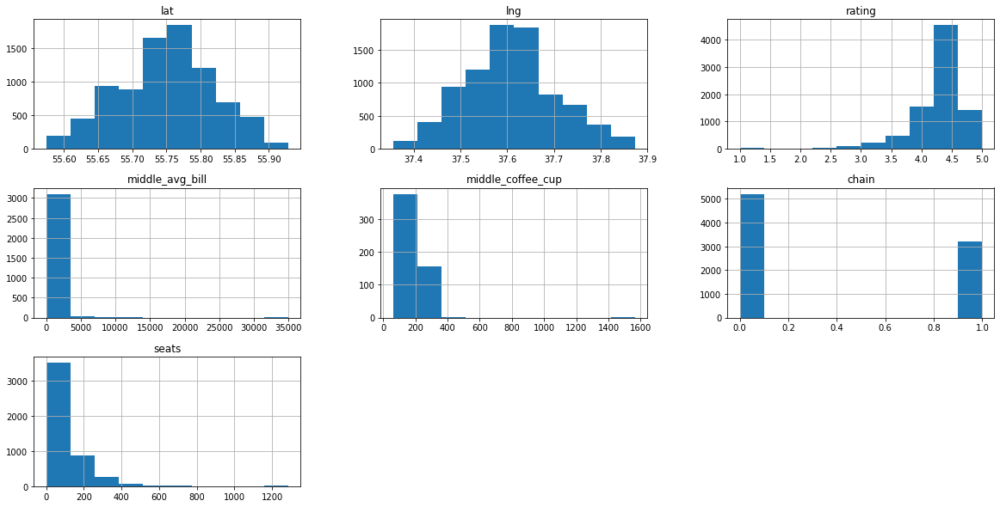

In [4]:
df.hist(figsize=(20,10));

In [5]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Изучил общую информацию о датасете. Представлено 8406 заведений. Каждый столбец имеет значения соответственного ему типа.

## Шаг 2. Предобработка данных

### Работа с пропусками

In [6]:
# посмотрел сколько и где есть пропусков
df.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7871
middle_avg_bill      5257
price                5091
avg_bill             4590
seats                3611
hours                 536
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [7]:
df.middle_coffee_cup.unique() # ничего не буду делать с пропусками

array([  nan,  170.,  145.,  150.,  180.,  120.,  100.,  256.,  160.,
        250.,  165.,  149.,  135.,  220.,  175.,  195.,   60.,  214.,
         75.,   89.,   95.,  204.,   90.,  140.,  125.,  162.,  155.,
        154.,  297.,  205.,  124.,  200.,  190.,  134.,  139.,  287.,
        225.,  230.,  237.,  290.,  254.,  279.,  174.,  179.,  295.,
        245.,  105.,  285.,  270.,   84.,  127.,   80.,  112.,  185.,
        210.,  325.,  159.,  215.,  110.,  266.,  242.,  137.,  255.,
        240.,  217.,  315.,  130.,  167.,  169.,  235., 1568.,   79.,
        260.,  300.,  291.,  275.,  115.,  328.,   94.,  265.,  184.,
        229.,  164.,  172.,  259.,  246.,  199.,  138.,  375.,  189.,
        320.,  197.,  227.,  102.,  119.,  144.,  129.])

In [8]:
df.middle_avg_bill.unique() # числовые значения пустые не буду ничем заменять

array([      nan, 1.550e+03, 1.000e+03, 5.000e+02, 1.990e+02, 2.500e+02,
       1.100e+03, 3.300e+02, 1.500e+03, 4.000e+02, 2.450e+02, 4.250e+02,
       9.000e+02, 2.400e+02, 2.250e+02, 3.280e+02, 3.000e+02, 3.450e+02,
       2.300e+02, 6.500e+02, 7.500e+02, 1.250e+03, 1.750e+03, 2.250e+03,
       6.000e+02, 4.500e+02, 8.500e+02, 2.100e+03, 3.490e+02, 2.000e+02,
       1.200e+02, 2.690e+02, 1.300e+03, 1.150e+03, 3.550e+02, 2.750e+02,
       1.200e+03, 5.750e+02, 3.500e+02, 7.000e+02, 2.840e+02, 1.500e+02,
       3.620e+02, 3.250e+02, 2.000e+03, 2.910e+02, 2.800e+02, 2.750e+03,
       1.400e+03, 2.500e+03, 2.150e+03, 5.000e+03, 8.250e+02, 6.250e+02,
       3.250e+03, 6.750e+02, 4.750e+02, 1.690e+03, 9.250e+02, 1.050e+03,
       3.400e+02, 9.500e+02, 1.025e+03, 3.210e+02, 5.500e+02, 3.600e+02,
       3.750e+02, 3.170e+02, 3.240e+02, 3.430e+02, 1.400e+02, 1.650e+02,
       2.150e+02, 5.490e+02, 1.750e+02, 3.130e+02, 1.375e+03, 1.000e+02,
       9.750e+02, 1.100e+04, 8.000e+02, 2.950e+02, 

In [9]:
df.price.unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [10]:
# заменил пустоты на не указано, так как не известно что за ценовая категория
df.price.fillna('Не указано', inplace=True)
df.price.unique()

array(['Не указано', 'выше среднего', 'средние', 'высокие', 'низкие'],
      dtype=object)

In [11]:
df.seats.unique() # неизвестно сколько мест, лучше не трогать

array([      nan, 4.000e+00, 4.500e+01, 1.480e+02, 7.900e+01, 6.500e+01,
       1.020e+02, 1.800e+02, 9.600e+01, 2.500e+01, 4.600e+01, 4.000e+01,
       2.470e+02, 2.100e+01, 8.000e+00, 3.500e+01, 2.400e+02, 8.500e+01,
       1.200e+01, 6.000e+01, 1.200e+02, 1.600e+01, 8.000e+01, 5.000e+01,
       4.400e+01, 4.300e+01, 9.000e+01, 0.000e+00, 1.980e+02, 9.500e+01,
       3.500e+02, 1.240e+02, 1.000e+01, 7.000e+01, 4.800e+01, 6.000e+00,
       9.800e+01, 3.000e+01, 5.200e+01, 2.000e+01, 2.000e+00, 1.800e+01,
       2.200e+01, 1.500e+01, 2.800e+01, 3.000e+02, 7.500e+01, 3.200e+01,
       1.000e+02, 1.100e+02, 2.300e+02, 2.500e+02, 1.300e+02, 8.400e+01,
       3.980e+02, 2.700e+01, 2.860e+02, 1.450e+02, 3.600e+01, 9.700e+01,
       2.260e+02, 1.400e+02, 1.660e+02, 2.020e+02, 9.400e+01, 1.890e+02,
       5.300e+01, 1.040e+02, 7.200e+01, 1.310e+02, 1.050e+02, 5.500e+01,
       1.700e+01, 1.000e+00, 1.150e+02, 3.100e+02, 7.700e+01, 1.600e+02,
       3.200e+02, 3.400e+01, 1.500e+02, 2.000e+02, 

In [12]:
df.hours.unique() # нечего заменяь

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

Проработал пропуски в данных, заменил в категориальных значениях на неизвестно, в остальном, оставил данные без изменений.

### Работа с дубликатами

In [13]:
dubli = []
for i in df:
    temp = df.duplicated(i).sum()
    dubli.append(temp)
dubli

[2792,
 8398,
 2653,
 8397,
 7098,
 197,
 148,
 8365,
 8401,
 7508,
 8175,
 8309,
 8404,
 8176]

Много дубликатов,  буду разбираться

In [14]:
df.name.unique().tolist()

['WoWфли',
 'Четыре комнаты',
 'Хазри',
 'Dormouse Coffee Shop',
 'Иль Марко',
 'Sergio Pizza',
 'Огни города',
 'Mr. Уголёк',
 'Donna Maria',
 'Готика',
 'Great Room Bar',
 'Шашлык Шефф',
 'Заправка',
 'Буханка',
 'У Сильвы',
 'Дом обеда',
 'База Стритфуд',
 'Чайхана Беш-Бармак',
 'Час-Пик',
 'Пекарня',
 'Чебуреки Манты',
 '7/12',
 'Крымские чебуреки',
 'Drive Café',
 'В парке вкуснее',
 'Пикочино',
 'Шаурму Х@чу',
 'Mafe',
 'Кушай Город',
 'Кафедра',
 'Алталия',
 'Додо Пицца',
 'Изба',
 "Домино'с Пицца",
 'Виладж пицца',
 'Пекарня № 1 Грузинская кухня',
 'Халяль закусочная',
 'Ижора',
 'Шаурмагия',
 'Кафе',
 'Крошка Картошка',
 'Варня кафе',
 'Суши & пицца',
 'Кафетерий',
 '9 Bar Coffee',
 'CofeFest',
 'БлинБери',
 '2U-Ту-Ю',
 'Шаурма',
 'Арамье',
 'Cofix',
 'Royal Coffee',
 'Шашлык',
 'Чебуреки и манты',
 'Рыба из тандыра',
 'Мир пиццы',
 "Coffeekaldi's",
 'Хинкали Gали!',
 'Чебуречная история',
 'Кафе Лоза',
 'Пить Есть!',
 'Pizza Hut',
 'Testo мания',
 'Альбатрос',
 'Молинари',
 '

In [15]:
df.name.value_counts() 

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Coffeehub             1
Заряд кофе            1
Чайхана Долина        1
Инсайт Кофе           1
Mafe                  1
Name: name, Length: 5614, dtype: int64

In [16]:
df.groupby('name')['chain'].sum().sort_values(ascending=False) # здесь дубли обусловлены тем, что эти компании сетевые

name
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Яндекс Лавка         69
                   ... 
Белочка               0
Белорусская хата      0
Белое озеро           0
Беллини               0
ночной Баку           0
Name: chain, Length: 5614, dtype: int64

In [17]:
df.category.unique().tolist() # категориальный столбец, нет смысла удалять дубли

['кафе',
 'ресторан',
 'кофейня',
 'пиццерия',
 'бар,паб',
 'быстрое питание',
 'булочная',
 'столовая']

In [18]:
df.address.value_counts()

Москва, проспект Вернадского, 86В              28
Москва, Усачёва улица, 26                      26
Москва, Ярцевская улица, 19                    20
Москва, площадь Киевского Вокзала, 2           20
Москва, Хорошёвское шоссе, 27                  16
                                               ..
Москва, улица Большие Каменщики, 2              1
Москва, МКАД, 87-й километр, 14                 1
Москва, Большая Филёвская улица, 3, корп. 2     1
Москва, улица Олеко Дундича, 3                  1
Москва, улица Антонова-Овсеенко, 15с4           1
Name: address, Length: 5753, dtype: int64

In [19]:
df.address.unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [20]:
# здесь возникают дубли по причине того, что все заведения находятся в крупном здании торговых центров
df[df.address == 'Москва, проспект Вернадского, 86В'] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6531,Паrk фудхолл,"бар,паб","Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661639,37.480197,4.6,Не указано,NaN,NaN,NaN,0,NaN
6532,I Need Doner,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 10:00...",55.661559,37.479887,4.9,Не указано,Средний счёт:400–700 ₽,550.0,NaN,1,NaN
6534,Fibo Pasta & Ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.661638,37.480148,4.8,средние,Средний счёт:500–1000 ₽,750.0,NaN,1,NaN
6547,Сыроварня,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661718,37.479907,4.5,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,NaN
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,Не указано,NaN,NaN,NaN,0,NaN
6568,Aly’s Poke,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661776,37.480123,4.6,средние,Средний счёт:390–660 ₽,525.0,NaN,0,NaN
6584,Курица и Утка по-Гонконгски,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661598,37.480319,4.3,Не указано,NaN,NaN,NaN,0,NaN
6597,Асса Food,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661783,37.480264,4.3,Не указано,NaN,NaN,NaN,0,NaN
6604,Shrimp Kitchen,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.661768,37.480026,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN
6630,Мясоед,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661762,37.480336,4.2,Не указано,NaN,NaN,NaN,0,NaN


In [21]:
df.district.unique() # категориальные данные

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [22]:
df.hours.unique().tolist() # стандартные рабочие графики отображаются дублями

['ежедневно, 10:00–22:00',
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
 'ежедневно, 09:00–22:00',
 'ежедневно, 10:00–23:00',
 'пн 15:00–04:00; вт-вс 15:00–05:00',
 'пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00',
 'ежедневно, 12:00–00:00',
 'ежедневно, круглосуточно',
 'ежедневно, 10:00–21:00',
 'вт-сб 09:00–18:00',
 'ежедневно, 08:00–22:00',
 'ежедневно, 13:00–00:00',
 'пн-пт 08:30–18:30; сб 10:00–20:00',
 'ежедневно, 09:00–21:00',
 'пн-пт 09:00–21:00',
 'пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00–22:00',
 'пн-пт 08:00–22:00; сб,вс 10:00–22:00',
 'ежедневно, 10:00–19:00',
 'пн-пт 09:00–16:00',
 'ежедневно, 08:00–21:00',
 'ежедневно, 09:00–23:00',
 'ежедневно, 08:00–23:00',
 nan,
 'пн-пт 08:00–18:00',
 'пн-пт 09:00–19:00',
 'ежедневно, 11:00–00:00',
 'ежедневно, 09:00–02:00',
 'ежедневно, 12:00–23:00',
 'ежедневно, 12:00–03:00',
 'ежедневно, 16:00–06:00',
 'пн-чт 12:30–00:00; пт,сб 12:30–02:00; вс 12:30–00:00',
 'пн-сб 11:00–23:00; вс 12:00–23:00',
 'пн-пт 08:00

In [23]:
df.lat.unique().tolist() # находятся в одной точке

[55.878494,
 55.875801,
 55.889146,
 55.881608,
 55.881166,
 55.88801,
 55.890752,
 55.890636,
 55.880045,
 55.879038,
 55.877832,
 55.88177,
 55.899938,
 55.877007,
 55.885528,
 55.88589,
 55.877859,
 55.876908,
 55.884651,
 55.887969,
 55.880287,
 55.876805,
 55.883414,
 55.888421,
 55.879992,
 55.878453,
 55.87939,
 55.879324,
 55.893061,
 55.898414,
 55.879723,
 55.878691,
 55.877388,
 55.89003,
 55.886963,
 55.876278,
 55.882222,
 55.888023,
 55.888366,
 55.880831,
 55.895115,
 55.878515,
 55.88001,
 55.928943,
 55.876289,
 55.885837,
 55.879934,
 55.880306,
 55.878511,
 55.88616,
 55.878339,
 55.878014,
 55.878531,
 55.880622,
 55.887978,
 55.880288,
 55.896323,
 55.900316,
 55.906281,
 55.899845,
 55.898085,
 55.902557,
 55.898081,
 55.900058,
 55.898061,
 55.887887,
 55.883112,
 55.890415,
 55.897679,
 55.888623,
 55.901799,
 55.891196,
 55.906875,
 55.889243,
 55.881626,
 55.889759,
 55.888705,
 55.909009,
 55.92039,
 55.885986,
 55.897789,
 55.883422,
 55.889872,
 55.896987,


In [24]:
df.lng.unique().tolist() # находятся в одной точке

[37.47886,
 37.484479,
 37.525901,
 37.48886,
 37.449357,
 37.509573,
 37.524653,
 37.524303,
 37.539006,
 37.524487,
 37.469171,
 37.492362,
 37.517958,
 37.50498,
 37.528371,
 37.493264,
 37.507754,
 37.449876,
 37.517482,
 37.515688,
 37.448646,
 37.464934,
 37.514572,
 37.527106,
 37.481571,
 37.460028,
 37.541228,
 37.48028,
 37.501319,
 37.539256,
 37.510227,
 37.478993,
 37.523334,
 37.537515,
 37.523518,
 37.505575,
 37.518057,
 37.515443,
 37.514856,
 37.510574,
 37.524902,
 37.479308,
 37.520204,
 37.540548,
 37.519315,
 37.513422,
 37.492522,
 37.48976,
 37.479158,
 37.508784,
 37.483154,
 37.522867,
 37.479395,
 37.448529,
 37.515823,
 37.448645,
 37.51596,
 37.540918,
 37.570558,
 37.576517,
 37.570488,
 37.565872,
 37.586001,
 37.571696,
 37.570544,
 37.57346,
 37.588294,
 37.558867,
 37.581229,
 37.591366,
 37.588011,
 37.577672,
 37.585653,
 37.582493,
 37.594633,
 37.545617,
 37.53045,
 37.555713,
 37.558619,
 37.553977,
 37.602098,
 37.588189,
 37.558293,
 37.591299,


In [25]:
df.rating.unique().tolist() # могут быть одинаковые оценки

[5.0,
 4.5,
 4.6,
 4.4,
 4.7,
 4.8,
 4.3,
 4.9,
 4.2,
 4.1,
 4.0,
 3.8,
 3.9,
 3.7,
 3.6,
 2.8,
 2.7,
 3.1,
 1.5,
 2.0,
 1.4,
 3.3,
 3.5,
 3.2,
 2.9,
 3.0,
 3.4,
 2.3,
 2.2,
 2.5,
 2.6,
 1.7,
 1.0,
 1.1,
 2.4,
 1.3,
 1.2,
 2.1,
 1.8,
 1.9,
 1.6]

In [26]:
df.price.unique() # категориальные данные

array(['Не указано', 'выше среднего', 'средние', 'высокие', 'низкие'],
      dtype=object)

In [27]:
df.avg_bill.unique() # диапазон средних значений может совпадать

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

In [28]:
df.middle_avg_bill.unique().tolist() #  число с оценкой среднего чека по медиане может совпадать

[nan,
 1550.0,
 1000.0,
 500.0,
 199.0,
 250.0,
 1100.0,
 330.0,
 1500.0,
 400.0,
 245.0,
 425.0,
 900.0,
 240.0,
 225.0,
 328.0,
 300.0,
 345.0,
 230.0,
 650.0,
 750.0,
 1250.0,
 1750.0,
 2250.0,
 600.0,
 450.0,
 850.0,
 2100.0,
 349.0,
 200.0,
 120.0,
 269.0,
 1300.0,
 1150.0,
 355.0,
 275.0,
 1200.0,
 575.0,
 350.0,
 700.0,
 284.0,
 150.0,
 362.0,
 325.0,
 2000.0,
 291.0,
 280.0,
 2750.0,
 1400.0,
 2500.0,
 2150.0,
 5000.0,
 825.0,
 625.0,
 3250.0,
 675.0,
 475.0,
 1690.0,
 925.0,
 1050.0,
 340.0,
 950.0,
 1025.0,
 321.0,
 550.0,
 360.0,
 375.0,
 317.0,
 324.0,
 343.0,
 140.0,
 165.0,
 215.0,
 549.0,
 175.0,
 313.0,
 1375.0,
 100.0,
 975.0,
 11000.0,
 800.0,
 295.0,
 3750.0,
 1350.0,
 430.0,
 130.0,
 525.0,
 344.0,
 185.0,
 1800.0,
 875.0,
 480.0,
 695.0,
 261.0,
 1450.0,
 3000.0,
 180.0,
 404.0,
 235.0,
 366.0,
 304.0,
 4500.0,
 560.0,
 470.0,
 387.0,
 1850.0,
 1900.0,
 315.0,
 363.0,
 260.0,
 2900.0,
 210.0,
 190.0,
 2200.0,
 299.0,
 1650.0,
 426.0,
 1175.0,
 4250.0,
 365.0,
 630.

In [29]:
df.middle_coffee_cup.value_counts() # число с оценкой одной чашки капучино может совпадать

256.0    43
60.0     33
95.0     32
150.0    24
170.0    18
         ..
320.0     1
227.0     1
137.0     1
172.0     1
259.0     1
Name: middle_coffee_cup, Length: 96, dtype: int64

In [30]:
df.chain.unique() # категориальные данные (сетевая или не сетевая)

array([0, 1])

In [31]:
df.seats.unique().tolist() # наиболее распространенное количество посадочных мест может совпадать

[nan,
 4.0,
 45.0,
 148.0,
 79.0,
 65.0,
 102.0,
 180.0,
 96.0,
 25.0,
 46.0,
 40.0,
 247.0,
 21.0,
 8.0,
 35.0,
 240.0,
 85.0,
 12.0,
 60.0,
 120.0,
 16.0,
 80.0,
 50.0,
 44.0,
 43.0,
 90.0,
 0.0,
 198.0,
 95.0,
 350.0,
 124.0,
 10.0,
 70.0,
 48.0,
 6.0,
 98.0,
 30.0,
 52.0,
 20.0,
 2.0,
 18.0,
 22.0,
 15.0,
 28.0,
 300.0,
 75.0,
 32.0,
 100.0,
 110.0,
 230.0,
 250.0,
 130.0,
 84.0,
 398.0,
 27.0,
 286.0,
 145.0,
 36.0,
 97.0,
 226.0,
 140.0,
 166.0,
 202.0,
 94.0,
 189.0,
 53.0,
 104.0,
 72.0,
 131.0,
 105.0,
 55.0,
 17.0,
 1.0,
 115.0,
 310.0,
 77.0,
 160.0,
 320.0,
 34.0,
 150.0,
 200.0,
 107.0,
 26.0,
 24.0,
 49.0,
 220.0,
 125.0,
 7.0,
 500.0,
 210.0,
 225.0,
 273.0,
 106.0,
 112.0,
 176.0,
 69.0,
 229.0,
 62.0,
 9.0,
 239.0,
 246.0,
 42.0,
 188.0,
 174.0,
 14.0,
 76.0,
 232.0,
 68.0,
 625.0,
 83.0,
 92.0,
 128.0,
 245.0,
 58.0,
 67.0,
 82.0,
 3.0,
 63.0,
 38.0,
 56.0,
 190.0,
 47.0,
 61.0,
 307.0,
 138.0,
 217.0,
 64.0,
 78.0,
 5.0,
 343.0,
 147.0,
 88.0,
 86.0,
 74.0,
 420.0,
 

In [32]:
df.duplicated().sum() # дублей нет

0

In [33]:
df.name = df.name.replace('ё', 'е')
df.name = df.name.replace('`', '')
df.name = df.name.str.strip()
df.name = df.name.str.lower()
df.name.unique().tolist()

['wowфли',
 'четыре комнаты',
 'хазри',
 'dormouse coffee shop',
 'иль марко',
 'sergio pizza',
 'огни города',
 'mr. уголёк',
 'donna maria',
 'готика',
 'great room bar',
 'шашлык шефф',
 'заправка',
 'буханка',
 'у сильвы',
 'дом обеда',
 'база стритфуд',
 'чайхана беш-бармак',
 'час-пик',
 'пекарня',
 'чебуреки манты',
 '7/12',
 'крымские чебуреки',
 'drive café',
 'в парке вкуснее',
 'пикочино',
 'шаурму х@чу',
 'mafe',
 'кушай город',
 'кафедра',
 'алталия',
 'додо пицца',
 'изба',
 "домино'с пицца",
 'виладж пицца',
 'пекарня № 1 грузинская кухня',
 'халяль закусочная',
 'ижора',
 'шаурмагия',
 'кафе',
 'крошка картошка',
 'варня кафе',
 'суши & пицца',
 'кафетерий',
 '9 bar coffee',
 'cofefest',
 'блинбери',
 '2u-ту-ю',
 'шаурма',
 'арамье',
 'cofix',
 'royal coffee',
 'шашлык',
 'чебуреки и манты',
 'рыба из тандыра',
 'мир пиццы',
 "coffeekaldi's",
 'хинкали gали!',
 'чебуречная история',
 'кафе лоза',
 'пить есть!',
 'pizza hut',
 'testo мания',
 'альбатрос',
 'молинари',
 '

In [34]:
df.address = df.address.replace('ё', 'е')
df.address = df.address.str.strip()
df.address = df.address.str.lower()
df.address.unique().tolist()

['москва, улица дыбенко, 7/1',
 'москва, улица дыбенко, 36, корп. 1',
 'москва, клязьминская улица, 15',
 'москва, улица маршала федоренко, 12',
 'москва, правобережная улица, 1б',
 'москва, ижорская улица, вл8б',
 'москва, клязьминская улица, 9, стр. 3',
 'москва, дмитровское шоссе, 107, корп. 4',
 'москва, ангарская улица, 39',
 'москва, левобережная улица, 12',
 'москва, улица маршала федоренко, 10с1',
 'москва, мкад, 80-й километр, 1',
 'москва, базовская улица, 15, корп. 1',
 'москва, ангарская улица, 42с1',
 'москва, улица бусиновская горка, 2',
 'москва, базовская улица, 15, корп. 8',
 'москва, ленинградское шоссе, 71б, стр. 2',
 'москва, коровинское шоссе, 30а',
 'москва, ижорский проезд, 5',
 'москва, прибрежный проезд, 7',
 'москва, коровинское шоссе, 35, стр. 17',
 'москва, лобненская улица, 13к2',
 'москва, улица дыбенко, 9ас1',
 'москва, парк левобережный',
 'москва, дмитровское шоссе, 107к2',
 'москва, улица дыбенко, 7, стр. 1',
 'москва, мкад, 78-й километр, 14к1',
 'мос

In [35]:
df.duplicated(subset=['name', 'address']).sum()

4

In [36]:
df = df.drop_duplicates(subset=['name', 'address']) # удалил дубли
df.duplicated(subset=['name', 'address']).sum() # проверил, больше не осталось

0

In [37]:
# добавил столбец с улицами
df['street'] = df['address'].str.split(', ').str[1]
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,Не указано,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Не указано,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [38]:
df.street.unique().tolist()

['улица дыбенко',
 'клязьминская улица',
 'улица маршала федоренко',
 'правобережная улица',
 'ижорская улица',
 'дмитровское шоссе',
 'ангарская улица',
 'левобережная улица',
 'мкад',
 'базовская улица',
 'улица бусиновская горка',
 'ленинградское шоссе',
 'коровинское шоссе',
 'ижорский проезд',
 'прибрежный проезд',
 'лобненская улица',
 'парк левобережный',
 'угличская улица',
 'абрамцевская улица',
 'ландшафтный заказник лианозовский',
 'череповецкая улица',
 'алтуфьевское шоссе',
 'лианозовский парк культуры и отдыха',
 'дубнинская улица',
 'илимская улица',
 'шенкурский проезд',
 'новгородская улица',
 'парк алтуфьево',
 'улица пришвина',
 'бульвар академика ландау',
 'улица лескова',
 'улица плещеева',
 'бибиревская улица',
 'лианозовский проезд',
 'челобитьевское шоссе',
 'костромская улица',
 'карельский бульвар',
 'инженерная улица',
 'парк ангарские пруды',
 'улица софьи ковалевской',
 'улица корнейчука',
 'проектируемый проезд № 5265',
 'улица римского-корсакова',
 'улица

In [39]:
# добавил столбец с заведениями, которые работают без выходных и круглые сутки
df['is_24/7'] = df['hours'] == 'ежедневно, круглосуточно'
df.head() 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,Не указано,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Не указано,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


Осуществил предобработку данных, в которой проработал пропуски и дубликаты, в основном оставил их как есть, так как много категориальных данных, а они совпадают, поэтому смысла в их устранении нет.

## Шаг 3. Анализ данных

**Какие категории заведений представлены в данных?**

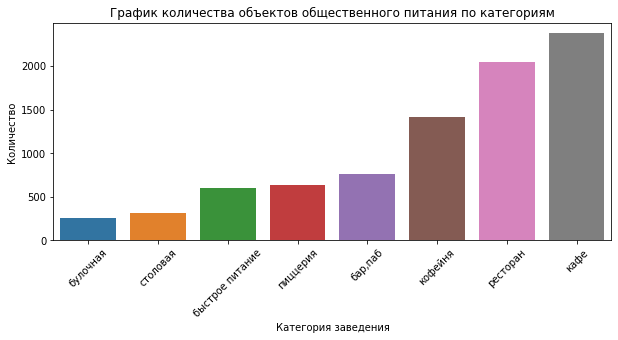

In [40]:
count_category = df.groupby('category')['name'].count().reset_index().sort_values(by='name')
# sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='name', data=count_category)
plt.title('График количества объектов общественного питания по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.xticks(rotation=45);

В данных представлены следующие категории: булочная, столовая, быстрое питание, пиццерия, бар/паб, кофейня, ресторан и кафе. Наиболее распространенные категории это кофейня, ресторан и кафе.

**Какое количество посадочных мест в местах по категориям?**

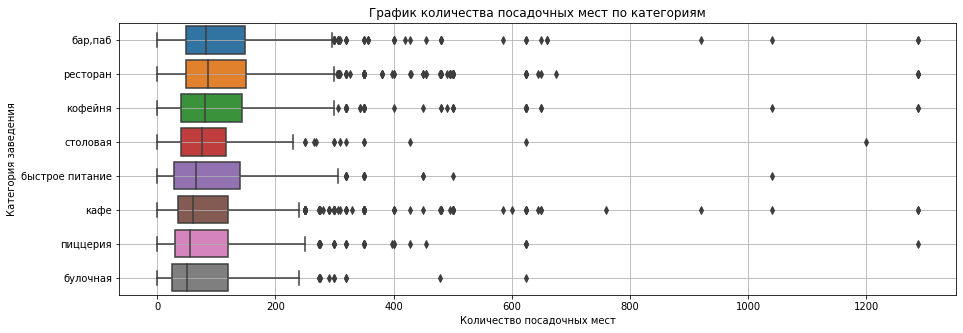

In [41]:
rest_grouped_seats = (df.groupby('category')
                              .agg(mean_seats=('seats', 'mean'))
                              .sort_values(by='mean_seats', ascending=False))
plt.figure(figsize=(15, 5))
sns.boxplot(y=df['category'], x=df['seats'], order=rest_grouped_seats.index)
plt.title('График количества посадочных мест по категориям')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.grid();

Исходя из данных, можно сделать вывод, что количество посадочных мест варьируется от 50 до 100. Самое большое количество посадочных мест в кофейне, ресторанах и барах/пабах.

**Соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [42]:
# общее количество сетевых и не сетевых заведений
total = df.chain.count()
total

8402

In [43]:
# соотношение сетевых к общему количеству в %
chain = df.query('chain == 1')
chain = chain.chain.count()
chain = chain / total * 100

In [44]:
# соотношение не сетевых к общему количеству в %
nonchain = df.query('chain == 0')
nonchain = nonchain.chain.count()
nonchain = nonchain / total * 100

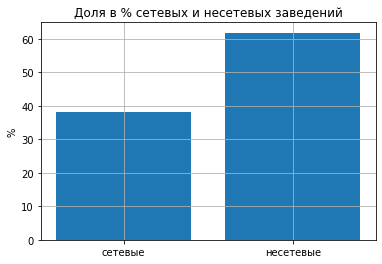

In [45]:
plt.bar(['сетевые', 'несетевые'], [chain, nonchain])
plt.title('Доля в % сетевых и несетевых заведений')
plt.ylabel('%')
plt.grid();

На графике видно, что наибольшее количество заведений составляют не сетевые заведения.

**Какие категории заведений чаще являются сетевыми?**

In [46]:
chain_category = df.pivot_table(index = 'category', values='name', 
                                columns = 'chain', aggfunc='count').reset_index()
chain_category.columns = ['category', 'no_chain', 'chain']
chain_category['total'] = chain_category['no_chain'] + chain_category['chain']
chain_category['rate_chain'] = (chain_category['chain'] / chain_category['total']).round(2) * 100
chain_category['rate_no_chain'] = (chain_category['no_chain'] / chain_category['total']).round(2) * 100
chain_category['total_percent'] = chain_category['rate_chain'] + chain_category['rate_no_chain']
chain_category = chain_category.sort_values(by='rate_chain', ascending=False)
chain_category

,category,no_chain,chain,total,rate_chain,rate_no_chain,total_percent
1,булочная,99,157,256,61.0,39.0,100.0
5,пиццерия,303,330,633,52.0,48.0,100.0
4,кофейня,693,720,1413,51.0,49.0,100.0
2,быстрое питание,371,232,603,38.0,62.0,100.0
6,ресторан,1313,729,2042,36.0,64.0,100.0
3,кафе,1597,779,2376,33.0,67.0,100.0
7,столовая,227,88,315,28.0,72.0,100.0
0,"бар,паб",596,168,764,22.0,78.0,100.0


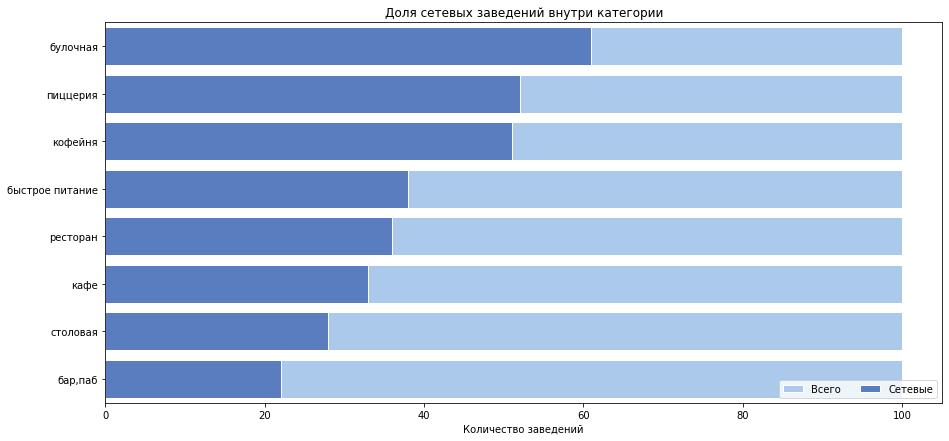

In [47]:
f, ax = plt.subplots(figsize = (15,7))
sns.set_color_codes('pastel')
sns.barplot(x = 'total_percent', y = 'category', data = chain_category,
           label = 'Всего', color = 'b', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x = 'rate_chain', y = 'category', data = chain_category,
           label = 'Сетевые', color = 'b', edgecolor = 'w')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="", xlabel="Количество заведений")
plt.title('Доля сетевых заведений внутри категории');

Категории булочная, пиццерия и кофейня чаще являются сетевыми.

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.**

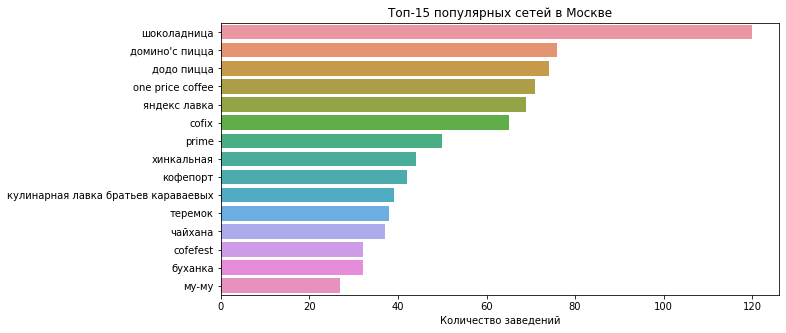

In [48]:
top_15 = (
    df.query('chain == 1')
    .groupby('name')['chain'].count()
    .sort_values(ascending=False)
    .head(15)
    .reset_index()
)
plt.figure(figsize=(10, 5))
sns.barplot(data=top_15, x='chain', y='name')

plt.title('Топ-15 популярных сетей в Москве')
plt.ylabel('')
plt.xlabel('Количество заведений');

Топ-15 это сетевые крупные и всем известные заведения общественного питания.

In [49]:
df.name.count() # всего заведений

8402

In [50]:
top = top_15.name.unique()
top

array(['шоколадница', "домино'с пицца", 'додо пицца', 'one price coffee',
       'яндекс лавка', 'cofix', 'prime', 'хинкальная', 'кофепорт',
       'кулинарная лавка братьев караваевых', 'теремок', 'чайхана',
       'cofefest', 'буханка', 'му-му'], dtype=object)

In [51]:
res = df.query('name in @top')
res.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,Не указано,NaN,NaN,NaN,1,180.0,базовская улица,False
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,Не указано,NaN,NaN,NaN,1,NaN,лобненская улица,False
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,Не указано,Средний счёт:328 ₽,328.0,NaN,1,46.0,коровинское шоссе,False
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,Не указано,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,клязьминская улица,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,Не указано,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False


In [52]:
district_15 = pd.pivot_table(res , index='district', columns='category', 
                             values='name', aggfunc='count').reset_index().fillna(0).sort_values(by='ресторан')
district_15['total'] = (district_15['бар,паб'] + district_15['булочная']
                        + district_15['быстрое питание'] + district_15['кафе']
                        + district_15['кофейня'] + district_15['пиццерия']
                        + district_15['ресторан'] + district_15['столовая'])
district_15 = district_15.sort_values(by='total')

fig = go.Figure()

fig.add_trace(go.Bar(name='бар,паб', x = district_15['бар,паб'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='булочная', x = district_15['булочная'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='быстрое питание', x = district_15['быстрое питание'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='кафе', x = district_15['кафе'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='кофейня', x = district_15['кофейня'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='пиццерия', x = district_15['пиццерия'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='ресторан', x = district_15['ресторан'], 
                     y = district_15['district'], orientation='h'))
fig.add_trace(go.Bar(name='столовая', x = district_15['столовая'], 
                     y = district_15['district'], orientation='h'))

fig.update_layout(barmode='stack', 
                  title='Распределение заведений топ-15 популярных сетей Москвы по районам города и категориям')
fig.show()

Заведения сетевые известны мне, их объединяет наличие крупной сети, благодаря которой они занимают самые лучшие места в Москве. Самые распространенные сетевые организации общественного питания сосредоточены в ресторанах, кафе и кофейнях. Сосредоточены эти заведения в Центральном административном округе.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [55]:
district = pd.pivot_table(df ,index='district', columns='category', 
                          values='name', aggfunc='count').reset_index()

district['total'] = (district['бар,паб'] + district['булочная']
                     + district['быстрое питание'] + district['кафе']
                     + district['кофейня'] + district['пиццерия']
                     + district['ресторан'] + district['столовая']).sort_values()
district = district.sort_values(by='total')
district

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
1,Западный административный округ,50,37,62,238,150,71,218,24,850
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
8,Южный административный округ,68,25,85,264,131,73,202,44,892
2,Северный административный округ,68,39,58,234,193,77,188,41,898
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242


In [56]:
fig = go.Figure()

fig.add_trace(go.Bar(name='бар,паб', x = district['бар,паб'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='булочная', x = district['булочная'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='быстрое питание', x = district['быстрое питание'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='кафе', x = district['кафе'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='кофейня', x = district['кофейня'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='пиццерия', x = district['пиццерия'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='ресторан', x = district['ресторан'], 
                     y = district['district'], orientation='h'))
fig.add_trace(go.Bar(name='столовая', x = district['столовая'], 
                     y = district['district'], orientation='h'))

fig.update_layout(barmode='stack',
                 title='Распределение заведений и количество заведений каждой категории по районам')
fig.show()

В данных присутствуют Северный административный округ, Северо-Восточный административный округ,Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ,
       Юго-Восточный административный округ,
       Южный административный округ,
       Юго-Западный административный округ
Распределены заведения по районам не равномерно, по категориям также нет равномерности
       
Общее количество заведений 8406.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [57]:
rating = df.groupby('category')['rating'].mean().reset_index().sort_values(by='rating', ascending=False)
rating

,category,rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


Text(0, 0.5, 'Значение')

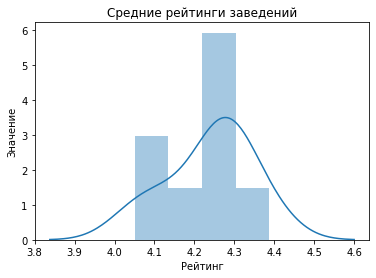

In [58]:
import warnings

warnings.filterwarnings(action='ignore')

sns.distplot(rating.rating)
plt.title('Средние рейтинги заведений')
plt.xlabel('Рейтинг')
plt.ylabel('Значение')

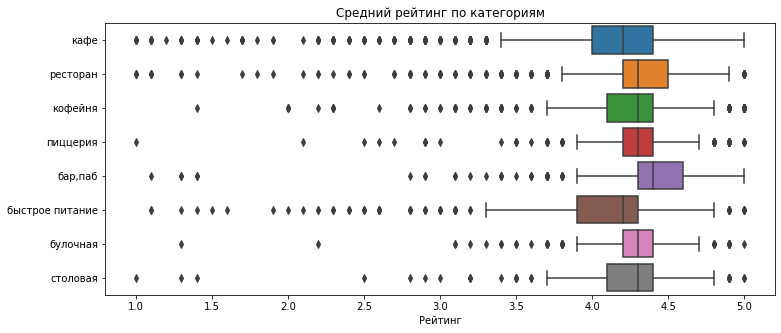

In [59]:
plt.figure(figsize=(12,5))
sns.boxplot(data=df, x='rating', y='category')
plt.title('Средний рейтинг по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('');

Усредненные рейтинги в разных типах общепита примерно одинаковые, варьируются от 4 до 4,4

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.**

In [60]:
avg_rating_district = df.groupby('district')['rating'].mean().reset_index()
avg_rating_district

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [61]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [62]:
from folium import Marker
from folium.plugins import MarkerCluster

marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)
m

Средний рейтинг заведений в центре выше чем в остальных административных округах.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [63]:
top_15_street = df.groupby('street')['name'].count().reset_index().sort_values(by='name', ascending=False)
top_15_street = top_15_street.head(15)
top_15_street.columns = ['street', 'total']
top_15_street

,street,total
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


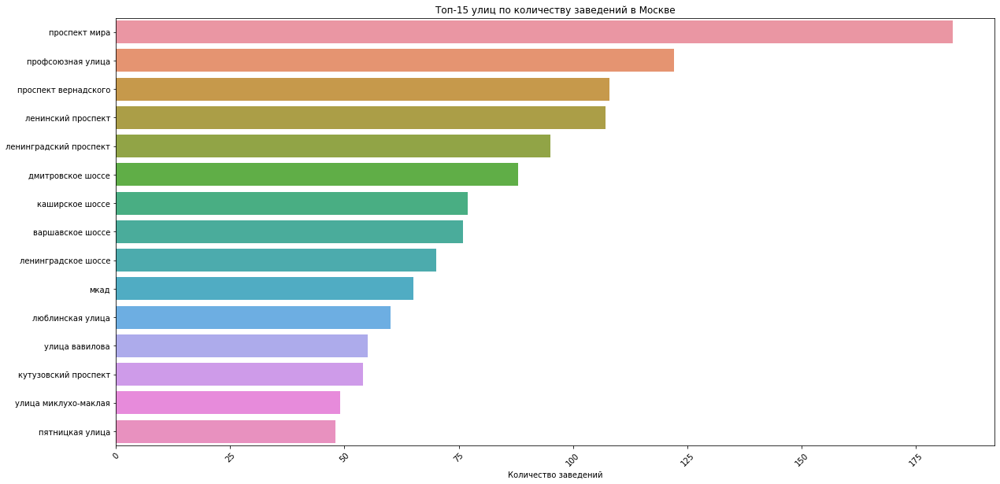

In [64]:
plt.figure(figsize=(20,10))
ax = sns.barplot(x='total', y='street', data=top_15_street)
ax.set_xlabel('Количество заведений')
ax.set_ylabel('')
ax.set_title('Топ-15 улиц по количеству заведений в Москве')
plt.xticks(rotation=45);

Проспект мира наиболее популярная улица.

In [65]:
test = pd.pivot_table(df, index='street', columns='category',
                     values='name', aggfunc='count').reset_index().fillna(0)

test['total'] = (test['бар,паб'] + test['булочная']
                     + test['быстрое питание'] + test['кафе']
                     + test['кофейня'] + test['пиццерия']
                     + test['ресторан'] + test['столовая'])
test = test.sort_values(by='total', ascending=False).head(15)
test

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
837,проспект мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183.0
841,профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
834,проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
533,ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
531,ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
379,дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
461,каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77.0
304,варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0,76.0
532,ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0
610,мкад,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0,65.0


In [66]:
fig = go.Figure()
fig.add_trace(go.Bar(name='бар,паб',x = test['бар,паб'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='булочная',x = test['булочная'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='быстрое питание',x = test['быстрое питание'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='кафе',x = test['кафе'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='кофейня',x = test['кофейня'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='пиццерия',x = test['пиццерия'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='ресторан',x = test['ресторан'], 
                     y = test['street'], orientation='h'))
fig.add_trace(go.Bar(name='столовая',x = test['столовая'], 
                     y = test['street'], orientation='h'))
fig.update_layout(barmode='stack',
                 title='Распределение заведений и количество заведений каждой категории по районам')
fig.show()

На этих топ-15 улиц самые распространенные категории общественного питания ресторан, кафе и кофейня.

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [67]:
one_street = (
    df.groupby('street')['name'].count()
    .reset_index()
    .query('name == 1')
    .sort_values(by='name', ascending=False)
)

one_street.columns = ['street', 'count']
one_street = one_street.merge(df, on='street', how='left')

one_street.head(15)

,street,count,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й автозаводский проезд,1,чайхана азия,кафе,"москва, 1-й автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,1,20.0,True
1,старомонетный переулок,1,baci abbracci,ресторан,"москва, старомонетный переулок, 18",Центральный административный округ,"ежедневно, 12:00–23:00",55.739860,37.618687,4.6,высокие,Средний счёт:1500–3500 ₽,2500.0,NaN,0,50.0,False
2,старокаширское шоссе,1,ресторан,ресторан,"москва, старокаширское шоссе, 2, корп. 10",Южный административный округ,NaN,55.660305,37.627834,4.2,Не указано,NaN,NaN,NaN,0,95.0,False
3,ставропольский проезд,1,звездопад,ресторан,"москва, ставропольский проезд, 7",Юго-Восточный административный округ,"ежедневно, 11:00–00:00",55.677006,37.800204,4.3,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,0,NaN,False
4,ставропольская улица,1,drive café,кафе,"москва, ставропольская улица, 31",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.682254,37.773623,3.3,Не указано,NaN,NaN,NaN,1,NaN,True
5,средний тишинский переулок,1,актавест,столовая,"москва, средний тишинский переулок, 8",Центральный административный округ,пн-пт 08:30–16:00,55.769923,37.579768,4.4,Не указано,NaN,NaN,NaN,0,NaN,False
6,софийская набережная,1,сакура place,"бар,паб","москва, софийская набережная, 30с1",Центральный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–02:00; вс 11:00...",55.747888,37.621392,4.5,средние,Средний счёт:700–1500 ₽,1100.0,NaN,0,NaN,False
7,солянский тупик,1,люди как люди,кафе,"москва, солянский тупик, 1",Центральный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.753925,37.636197,4.4,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,NaN,False
8,советская улица,1,ресторан,ресторан,"москва, советская улица, 80, стр. 9",Восточный административный округ,"ежедневно, круглосуточно",55.795988,37.751431,4.5,Не указано,NaN,NaN,NaN,0,NaN,True
9,смоленская-сенная площадь,1,де марко,кофейня,"москва, смоленская-сенная площадь, 23/25",Центральный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–23:00",55.744207,37.583003,4.4,высокие,Средний счёт:1300–1600 ₽,1450.0,NaN,0,100.0,False


In [68]:
one_street_1 = one_street.groupby('district')['name'].count().reset_index()
one_street_1

,district,name
0,Восточный административный округ,52
1,Западный административный округ,35
2,Северный административный округ,51
3,Северо-Восточный административный округ,55
4,Северо-Западный административный округ,19
5,Центральный административный округ,145
6,Юго-Восточный административный округ,39
7,Юго-Западный административный округ,18
8,Южный административный округ,43


In [69]:
moscow_lat, moscow_lng = 55.751244, 37.618423

map_one_street = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster2 = MarkerCluster().add_to(map_one_street)

def create_clusters2(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['name']}",
    ).add_to(marker_cluster2)

one_street.apply(create_clusters2, axis=1)

Choropleth(
    geo_data=state_geo,
    data=one_street_1,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Расположение одиночных на улице заведений по районам',
).add_to(map_one_street)


map_one_street

In [70]:
one_street.groupby(['category'])['name'].count().sort_values(ascending=False).reset_index()

,category,name
0,кафе,159
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Одиночные заведения являются не сетевыми и сосредоточены в центре, где большое скопление людей, офисов и культурных мест. Основу категорий составляют кафе, рестораны и кофейни.

**Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [71]:
mediana_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
mediana_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [72]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=mediana_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена заведений по районам',
).add_to(m1)
m1

Центр и западные административные округи самые дорогие, остальные более дешевые.

**Общий вывод.** В данных представлены следующие категории: булочная, столовая, быстрое питание, пиццерия, бар/паб, кофейня, ресторан и кафе. Наиболее распространенные категории это кофейня, ресторан и кафе.

Исходя из данных, можно сделать вывод, что количество посадочных мест варьируется от 50 до 100. Самое большое количество посадочных мест в кофейне, ресторанах и барах/пабах.

Наибольшее количество заведений составляют не сетевые заведения.

Категории булочная, пиццерия и кофейня чаще являются сетевыми.

Топ-15 это сетевые крупные и всем известные заведения общественного питания.

Заведения сетевые известны всем, их объединяет наличие крупной сети, благодаря которой они занимают самые лучшие места в Москве. Самые распространенные сетевые организации общественного питания сосредоточены в ресторанах, кафе и кофейнях. Сосредоточены эти заведения в Центральном административном округе. Всего заведений в Москве 8406.

В данных присутствуют Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ

Усредненные рейтинги в разных типах общепита примерно одинаковые, варьируются от 4 до 4,4

Средний рейтинг заведений в центре выше чем в остальных административных округах.

На этих топ-15 улиц самые распространенные категории общественного питания ресторан, кафе и кофейня.

Одиночные заведения являются не сетевыми и сосредоточены в центре, где большое скопление людей, офисов и культурных мест. Основу категорий составляют кафе, рестораны и кофейни.

Центр и западные административные округи самые дорогие, остальные более дешевые.


## Шаг 4. Детализация исследование: открытие кофейни

**Сколько всего кофеен в датасете?** 

In [73]:
df.category.value_counts()

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Кофеен всего 1413.

**В каких районах их больше всего, каковы особенности их расположения?**

In [74]:
coffee_house = df[df['category'] == 'кофейня']
coffee_house_group = coffee_house.groupby('district')['name'].count().reset_index().sort_values(by='name', ascending=False)
coffee_house_group

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


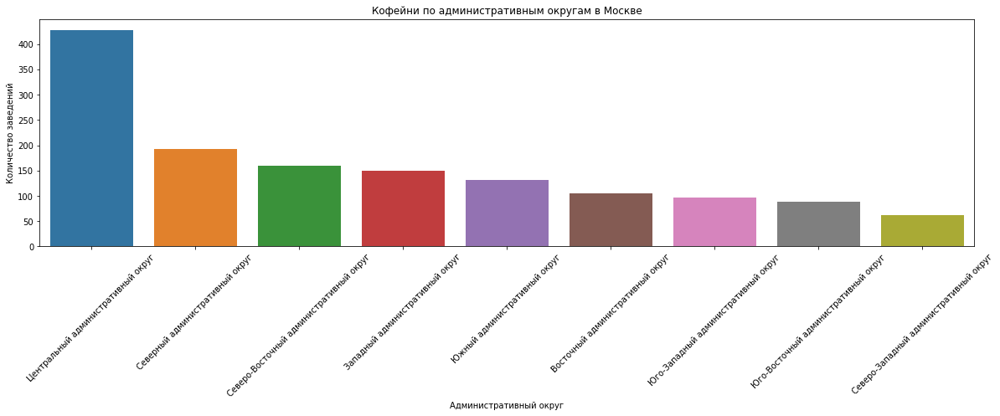

In [75]:
plt.figure(figsize=(20, 5))
sns.barplot(data=coffee_house_group, x='district', y='name')
plt.title('Кофейни по административным округам в Москве')
plt.xlabel('Административный округ')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45);

В основном кофейни находятся в центральном административном округе.

**Есть ли круглосуточные кофейни?**

In [76]:
caffee_24_7 = coffee_house[coffee_house['is_24/7'] == True]
caffee_24_7 = caffee_24_7['is_24/7'].count()
caffee_24_7 # сколько всего кофеен круглосуточных

59

In [77]:
# кофейни круглосуточные в процентах
caffee_24_7 = caffee_24_7 / 1413 * 100

In [78]:
non_24_7 = (1413 - 59) / 1413 * 100
non_24_7

95.82448690728945

Text(0, 0.5, '%')

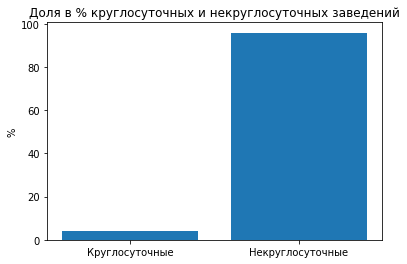

In [79]:
plt.bar(['Круглосуточные', 'Некруглосуточные'], [caffee_24_7, non_24_7])
plt.title('Доля в % круглосуточных и некруглосуточных заведений')
plt.ylabel('%')

Есть также круглосуточные кофейни, но их процент очень небольшой.

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [80]:
coffee_rating = coffee_house.groupby('district')['rating'].mean().reset_index()
coffee_rating

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


In [81]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m2)
m2

Рейтинг кофеен варьируется от 4,2 до 4,34, где самые высокие оценки в центре и северо-западном административном округе.

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [82]:
coffee_house.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Не указано,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,Не указано,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,Не указано,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,Не указано,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,Не указано,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [83]:
avg_cup = coffee_house.groupby('district')['middle_coffee_cup'].median().reset_index()
avg_cup

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [84]:
median_moscow_middle_coffee_cup = avg_cup.middle_coffee_cup.median()
median_moscow_middle_coffee_cup # чашка кофе в среднем по Москве

162.5

In [85]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана стоимости чашки кофе',
).add_to(m3)
m3

При открытии стоит ориентироваться на чашку кофе в среднем около 150-160 рублей, потому что на основе данных, среднее значение всех административных округов составляет 162,5 рубля за чашку кофе.

**Общий вывод**

Детализировал исследование: открытие кофейни. 

Кофеен всего 1413. В основном кофейни находятся в центральном административном округе.

Есть также круглосуточные кофейни, но их процент очень небольшой.

Рейтинг кофеен варьируется от 4,2 до 4,34, где самые высокие оценки в центре и северо-западном административном округе.

При открытии стоит ориентироваться на чашку кофе в среднем около 150-160 рублей, потому что на основе данных, среднее значение всех административных округов составляет 162,5 рубля за чашку кофе.

<div class="alert alert"; style="border-left: 7px solid purple">
<b>Рекомендации

    
При открытии стоит ориентироваться на чашку кофе в среднем около 150-160 рублей, потому что на основе данных, среднее значение всех административных округов составляет 162,5 рубля за чашку кофе, но при открытии в западном административном округе, можно рассчитывать на увеличение средней стоимости чашки кофе, так как в среднем она такая же, как и в дорогом центральном округе (чашка кофе в среднем составляет 190 рублей).

Лучше открывать кофейню в западном административном округе, так как стоимость чашки кофе примерно одинаковая, но конкуренция ниже.

Также, если открывать кофейню в западном административном округе, где рейтинг средний составляет 4,2 это незначительное отклонение от центрального округа, где оценка 4,32 средняя

Стоит обратить внимание также на круглосуточность, лучше открывать не круглосуточную кофейню, так как в ночное время кофе не популярное и в целом мало круглосуточных кофеен.</b>



## Шаг 5. Презентация.

https://drive.google.com/file/d/194i-NeRq7lzJb4hLIB_-Mv39HheKW3iV/view?usp=sharing